In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [4]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_dog.jpg': File exists


In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs/',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [7]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


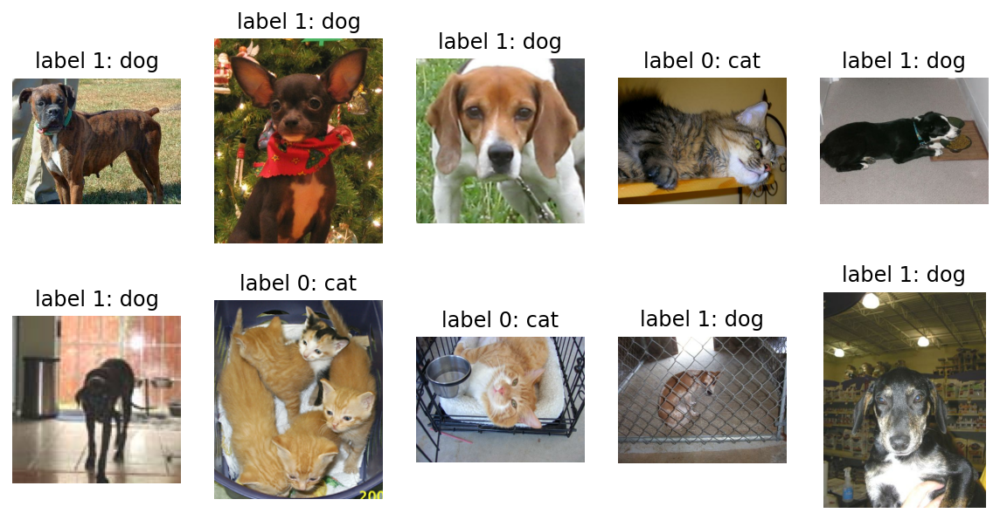

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [9]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [10]:
a = [1.2, 2.5, 3.7, 4.6] 
a = list(map(int, a))# 리스트의 요소를 정수로 변환 하여 리스트로 생성
a

[1, 2, 3, 4]

In [11]:
# [[YOUR CODE]]
a = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] 
a = list(map(str, a))
a

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [12]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


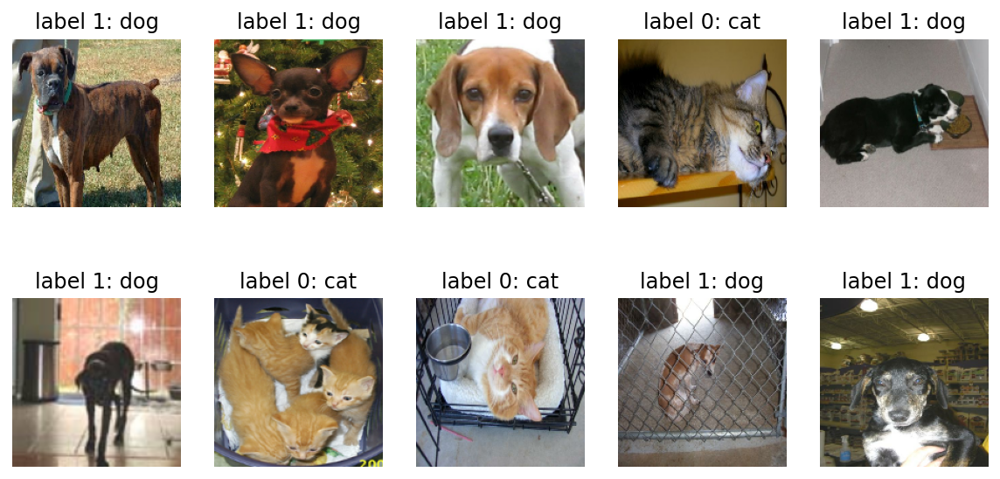

In [13]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [15]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

print("슝~")

슝~


In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [17]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [18]:
image.flatten()

array([1, 2, 3, 4])

In [19]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [20]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [21]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [22]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [23]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.6921 - accuracy: 0.5170

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 36s 32ms/step - loss: 0.6915 - accuracy: 0.5219
initial loss: 0.69
initial accuracy: 0.52


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


In [24]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
169/582 [=======>......................] - ETA: 18s - loss: 0.6625 - accuracy: 0.6117

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 17s - loss: 0.6554 - accuracy: 0.6193

212/582 [=========>....................] - ETA: 16s - loss: 0.6540 - accuracy: 0.6204

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 13s - loss: 0.6370 - accuracy: 0.6403

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 4s - loss: 0.6036 - accuracy: 0.6698

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.6025 - accuracy: 0.6711

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.6004 - accuracy: 0.6730

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.5978 - accuracy: 0.6751

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.5966 - accuracy: 0.6763

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5932 - accuracy: 0.6792

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 35s 49ms/step - loss: 0.5932 - accuracy: 0.6792 - val_loss: 0.5255 - val_accuracy: 0.7463
Epoch 2/10
169/582 [=======>......................] - ETA: 18s - loss: 0.5026 - accuracy: 0.7591

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.5018 - accuracy: 0.7595

213/582 [=========>....................] - ETA: 16s - loss: 0.5019 - accuracy: 0.7603

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.4981 - accuracy: 0.7608

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.4819 - accuracy: 0.7689

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4817 - accuracy: 0.7690

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.4816 - accuracy: 0.7692

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4802 - accuracy: 0.7702

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4792 - accuracy: 0.7708

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4781 - accuracy: 0.7716

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 47ms/step - loss: 0.4780 - accuracy: 0.7716 - val_loss: 0.4788 - val_accuracy: 0.7807
Epoch 3/10
170/582 [=======>......................] - ETA: 19s - loss: 0.4387 - accuracy: 0.7974

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.4385 - accuracy: 0.7987

211/582 [=========>....................] - ETA: 17s - loss: 0.4395 - accuracy: 0.7968

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.4304 - accuracy: 0.8026

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 4s - loss: 0.4203 - accuracy: 0.8073

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4196 - accuracy: 0.8084

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 3s - loss: 0.4190 - accuracy: 0.8087

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4175 - accuracy: 0.8094

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4169 - accuracy: 0.8099

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4161 - accuracy: 0.8097

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 30s 49ms/step - loss: 0.4161 - accuracy: 0.8098 - val_loss: 0.4789 - val_accuracy: 0.7760
Epoch 4/10
169/582 [=======>......................] - ETA: 19s - loss: 0.3925 - accuracy: 0.8214

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 17s - loss: 0.3930 - accuracy: 0.8213

212/582 [=========>....................] - ETA: 17s - loss: 0.3891 - accuracy: 0.8230

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.3850 - accuracy: 0.8277

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 4s - loss: 0.3679 - accuracy: 0.8369

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3674 - accuracy: 0.8368

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 3s - loss: 0.3676 - accuracy: 0.8369

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3654 - accuracy: 0.8380

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3648 - accuracy: 0.8381

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3635 - accuracy: 0.8383

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 49ms/step - loss: 0.3634 - accuracy: 0.8384 - val_loss: 0.5482 - val_accuracy: 0.7498
Epoch 5/10
170/582 [=======>......................] - ETA: 18s - loss: 0.3353 - accuracy: 0.8542

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.3346 - accuracy: 0.8537

212/582 [=========>....................] - ETA: 16s - loss: 0.3345 - accuracy: 0.8538

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.3276 - accuracy: 0.8577

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3174 - accuracy: 0.8616

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 3s - loss: 0.3169 - accuracy: 0.8620

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3167 - accuracy: 0.8619

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3148 - accuracy: 0.8625

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3145 - accuracy: 0.8627

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3137 - accuracy: 0.8625

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 48ms/step - loss: 0.3138 - accuracy: 0.8624 - val_loss: 0.4650 - val_accuracy: 0.7936
Epoch 6/10
169/582 [=======>......................] - ETA: 18s - loss: 0.2860 - accuracy: 0.8789

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.2867 - accuracy: 0.8780

213/582 [=========>....................] - ETA: 16s - loss: 0.2871 - accuracy: 0.8773

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.2822 - accuracy: 0.8801

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2713 - accuracy: 0.8863

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 3s - loss: 0.2703 - accuracy: 0.8868

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.2689 - accuracy: 0.8876

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.2677 - accuracy: 0.8883

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.2671 - accuracy: 0.8887

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.2667 - accuracy: 0.8887

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 47ms/step - loss: 0.2664 - accuracy: 0.8889 - val_loss: 0.4879 - val_accuracy: 0.7889
Epoch 7/10
169/582 [=======>......................] - ETA: 20s - loss: 0.2375 - accuracy: 0.9022

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 18s - loss: 0.2360 - accuracy: 0.9024

212/582 [=========>....................] - ETA: 17s - loss: 0.2359 - accuracy: 0.9024

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 14s - loss: 0.2290 - accuracy: 0.9068

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 4s - loss: 0.2216 - accuracy: 0.9106

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2213 - accuracy: 0.9108

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 3s - loss: 0.2204 - accuracy: 0.9114

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2182 - accuracy: 0.9125

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2180 - accuracy: 0.9125

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2168 - accuracy: 0.9130

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 31s 52ms/step - loss: 0.2169 - accuracy: 0.9130 - val_loss: 0.5955 - val_accuracy: 0.7623
Epoch 8/10
169/582 [=======>......................] - ETA: 19s - loss: 0.1970 - accuracy: 0.9255

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 17s - loss: 0.1959 - accuracy: 0.9265

212/582 [=========>....................] - ETA: 16s - loss: 0.1961 - accuracy: 0.9270

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 13s - loss: 0.1883 - accuracy: 0.9297

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 4s - loss: 0.1794 - accuracy: 0.9328

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 3s - loss: 0.1783 - accuracy: 0.9333

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1778 - accuracy: 0.9336

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1757 - accuracy: 0.9346

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1759 - accuracy: 0.9343

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1744 - accuracy: 0.9348

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 48ms/step - loss: 0.1744 - accuracy: 0.9348 - val_loss: 0.5178 - val_accuracy: 0.7979
Epoch 9/10
168/582 [=======>......................] - ETA: 18s - loss: 0.1535 - accuracy: 0.9449

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.1529 - accuracy: 0.9452

211/582 [=========>....................] - ETA: 16s - loss: 0.1532 - accuracy: 0.9455

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.1479 - accuracy: 0.9476

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1415 - accuracy: 0.9503

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 3s - loss: 0.1404 - accuracy: 0.9510

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1394 - accuracy: 0.9514

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1383 - accuracy: 0.9519

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1381 - accuracy: 0.9520

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1370 - accuracy: 0.9525

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 48ms/step - loss: 0.1370 - accuracy: 0.9524 - val_loss: 0.5819 - val_accuracy: 0.7932
Epoch 10/10
169/582 [=======>......................] - ETA: 18s - loss: 0.1137 - accuracy: 0.9601

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 17s - loss: 0.1121 - accuracy: 0.9614

211/582 [=========>....................] - ETA: 16s - loss: 0.1111 - accuracy: 0.9625

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 13s - loss: 0.1075 - accuracy: 0.9641

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 4s - loss: 0.1023 - accuracy: 0.9659

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1024 - accuracy: 0.9657

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 3s - loss: 0.1019 - accuracy: 0.9657

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1011 - accuracy: 0.9662

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1005 - accuracy: 0.9664

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0999 - accuracy: 0.9670

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 29s 48ms/step - loss: 0.0999 - accuracy: 0.9670 - val_loss: 0.8217 - val_accuracy: 0.7666


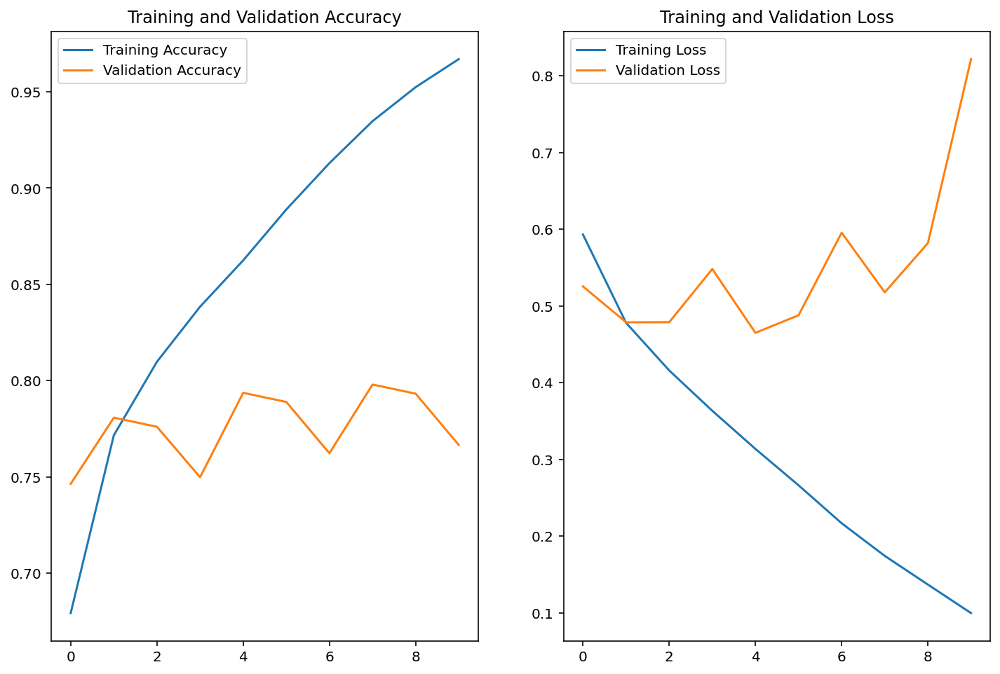

In [25]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [26]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[9.9993515e-01, 6.4845306e-05],
       [9.9928230e-01, 7.1776641e-04],
       [6.1154163e-01, 3.8845843e-01],
       [9.9999976e-01, 1.8485031e-07],
       [9.5204389e-01, 4.7956176e-02],
       [9.8400623e-01, 1.5993778e-02],
       [3.2163665e-03, 9.9678361e-01],
       [9.8412019e-01, 1.5879856e-02],
       [8.5174239e-01, 1.4825757e-01],
       [4.9179229e-01, 5.0820768e-01],
       [9.8488367e-01, 1.5116282e-02],
       [9.9997234e-01, 2.7686096e-05],
       [9.9898857e-01, 1.0113857e-03],
       [4.0406805e-02, 9.5959318e-01],
       [9.9580610e-01, 4.1939295e-03],
       [9.9978369e-01, 2.1627064e-04],
       [9.6568453e-01, 3.4315445e-02],
       [1.2715640e-05, 9.9998724e-01],
       [9.9089819e-01, 9.1018248e-03],
       [9.9994087e-01, 5.9124137e-05],
       [9.9847835e-01, 1.5216715e-03],
       [9.9403185e-01, 5.9681991e-03],
       [9.9998593e-01, 1.4095826e-05],
       [9.9715900e-01, 2.8409557e-03],
       [9.9850392e-01, 1.4961419e-03],
       [4.6170306e-01, 5.

In [27]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0])

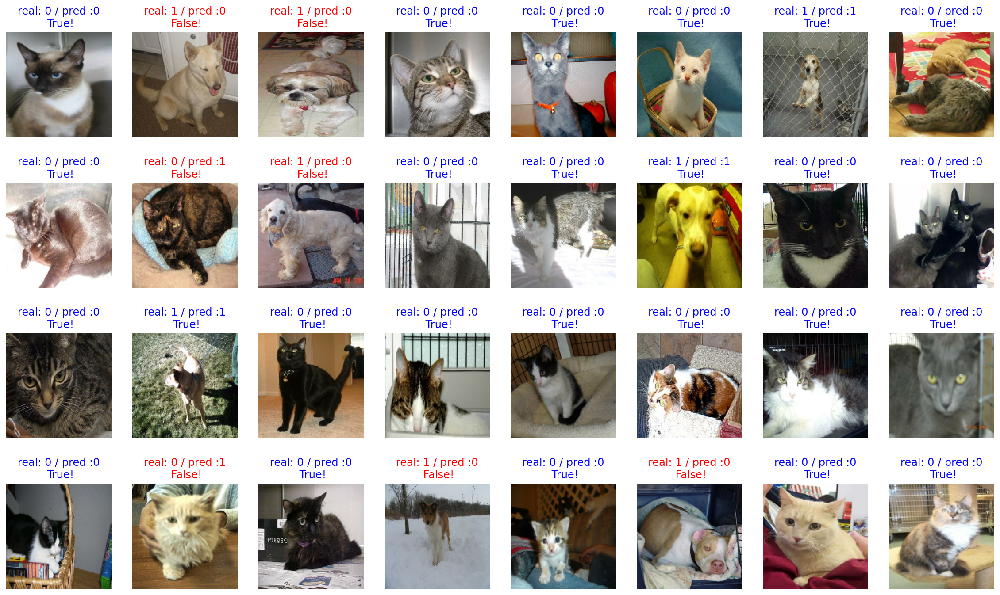

In [28]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [29]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    correct = label == prediction
    if correct:
        count += 1

print(count / 32 * 100)

78.125


### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [30]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [31]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [32]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [33]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [34]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [35]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


### Global Average Pooling

In [36]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [37]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [66]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.

# dense_layer = # [[YOUR CODE]]
# Global Average Pooling을 통과한 벡터의 shape는 [32, 512]였습니다.
# 따라서 Dense layer의 unit은 512로 설정합니다.
dense_layer = tf.keras.layers.Dense(
    units=512,  # Global Average Pooling 후의 벡터 크기
    activation='relu'  # 활성화 함수는 ReLU를 사용
)

# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
# prediction_layer = # [[YOUR CODE]]
# 분류하고자 하는 클래스의 수를 unit으로 설정합니다.
# 예를 들어, 클래스가 10개라면 unit=10으로 설정합니다.
prediction_layer = tf.keras.layers.Dense(
    units=2,  # 예시: 클래스가 10개일 경우
    activation='softmax'  # 활성화 함수는 Softmax를 사용
)

# 예를 들어, feature_batch_average가 Global Average Pooling을 통과한 [32, 512] 텐서라 가정
feature_batch_average = tf.random.normal([32, 512])  # 임의의 텐서 생성

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [67]:
base_model.trainable = False # 학습 안시킴
print("슝~")

슝~


In [68]:
# 모델만들기
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [69]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [70]:
base_learning_rate = 0.0001
# [[YOUR CODE]]

# 옵티마이저 정의 (예: Adam Optimizer)
optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate)

# 모델 컴파일
model.compile(
    optimizer=optimizer,  # 정의한 옵티마이저 사용
    loss='sparse_categorical_crossentropy',  # 손실 함수 (예시: 다중 클래스 분류의 경우)
    metrics=['accuracy']  # 평가 지표 (예시: 정확도)
)

In [72]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

ValueError: in user code:

    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:1330 test_function  *
        return step_function(self, iterator)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:1320 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /opt/conda/lib/python3.9/site-packages/tensorflow/python/distribute/distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:1313 run_step  **
        outputs = model.test_step(data)
    /opt/conda/lib/python3.9/site-packages/keras/engine/training.py:1267 test_step
        y_pred = self(x, training=False)
    /opt/conda/lib/python3.9/site-packages/keras/engine/base_layer.py:1020 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    /opt/conda/lib/python3.9/site-packages/keras/engine/input_spec.py:266 assert_input_compatibility
        raise ValueError('Input ' + str(input_index) +

    ValueError: Input 0 is incompatible with layer sequential_2: expected shape=(None, 224, 224, 3), found shape=(None, 160, 160, 3)


In [46]:
base_learning_rate = 0.0001
# [[YOUR CODE]]

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten

# 1. VGG16 모델 로드 및 준비
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(10, activation='softmax')(x)  # 예시: 10개의 클래스

vgg16_model = tf.keras.Model(inputs=base_model.input, outputs=predictions)

# 모델 컴파일
optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate)
vgg16_model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [47]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 1s - loss: 2.0227 - accuracy: 0.1667

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 2.0209 - accuracy: 0.1684

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 1s 66ms/step - loss: 2.0218 - accuracy: 0.1672
initial loss: 2.02
initial accuracy: 0.17


In [48]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
# [[YOUR CODE]]
# 데이터셋 준비 (예시로 임의 데이터 생성)
# 실제 데이터셋을 사용하려면 적절한 데이터 로더를 사용하세요.
train_images = tf.random.normal([100, 224, 224, 3])  # 예시 데이터: 100개 이미지, 224x224 크기, 3 채널
train_labels = tf.random.uniform([100], minval=0, maxval=10, dtype=tf.int32)  # 예시 레이블: 10개 클래스
validation_images = tf.random.normal([20, 224, 224, 3])  # 예시 데이터: 20개 이미지
validation_labels = tf.random.uniform([20], minval=0, maxval=10, dtype=tf.int32)  # 예시 레이블

vgg16_history = vgg16_model.fit(
    train_images, train_labels,
    epochs=EPOCHS,
    validation_data=(validation_images, validation_labels)
)


Epoch 1/5
4/4 [==============================] - 18s 3s/step - loss: 2.3355 - accuracy: 0.0900 - val_loss: 2.3492 - val_accuracy: 0.0500
Epoch 2/5
4/4 [==============================] - 1s 323ms/step - loss: 2.3193 - accuracy: 0.0900 - val_loss: 2.2927 - val_accuracy: 0.1500
Epoch 3/5
4/4 [==============================] - 1s 323ms/step - loss: 2.2949 - accuracy: 0.1200 - val_loss: 2.5778 - val_accuracy: 0.0500
Epoch 4/5
4/4 [==============================] - 1s 325ms/step - loss: 2.4021 - accuracy: 0.1600 - val_loss: 2.3921 - val_accuracy: 0.0500
Epoch 5/5
4/4 [==============================] - 1s 321ms/step - loss: 2.3064 - accuracy: 0.0700 - val_loss: 2.2923 - val_accuracy: 0.1000


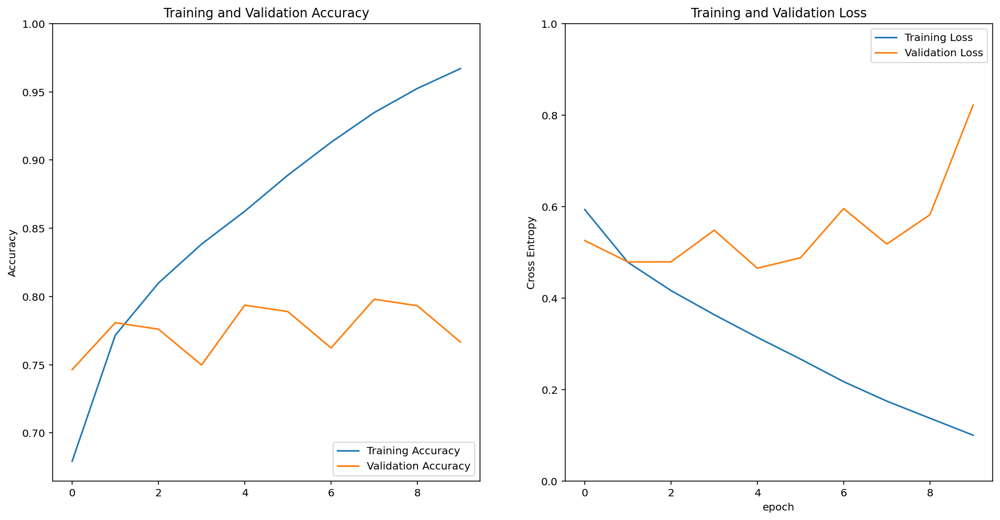

In [49]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [50]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[0.09327688, 0.18629205, 0.06275084, 0.08853941, 0.0321411 ,
        0.1678917 , 0.06994045, 0.14078712, 0.12921071, 0.02916976],
       [0.12163129, 0.15148254, 0.05901349, 0.12038118, 0.04039964,
        0.17419904, 0.05975948, 0.11353236, 0.12590383, 0.0336971 ],
       [0.10171319, 0.2116969 , 0.06284811, 0.09340834, 0.04315731,
        0.12866779, 0.08545714, 0.12781286, 0.11445556, 0.03078278],
       [0.09471811, 0.16210909, 0.06719156, 0.11804403, 0.02764139,
        0.20932606, 0.06177597, 0.12494394, 0.10143385, 0.03281602],
       [0.12246384, 0.13652745, 0.06382402, 0.10277363, 0.03369609,
        0.18651302, 0.07518925, 0.13017172, 0.10474978, 0.04409123],
       [0.11295016, 0.15244249, 0.06848481, 0.11843679, 0.03560661,
        0.1662395 , 0.06423195, 0.12122397, 0.12345452, 0.0369292 ],
       [0.10725261, 0.18017463, 0.05963013, 0.12152755, 0.04063037,
        0.15764593, 0.07599456, 0.1157775 , 0.11169735, 0.0296694 ],
       [0.12261105, 0.17749321, 0.0572755

In [51]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([1, 5, 1, 5, 5, 5, 1, 1, 5, 5, 7, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5,
       1, 1, 5, 1, 5, 5, 1, 5, 1, 1])

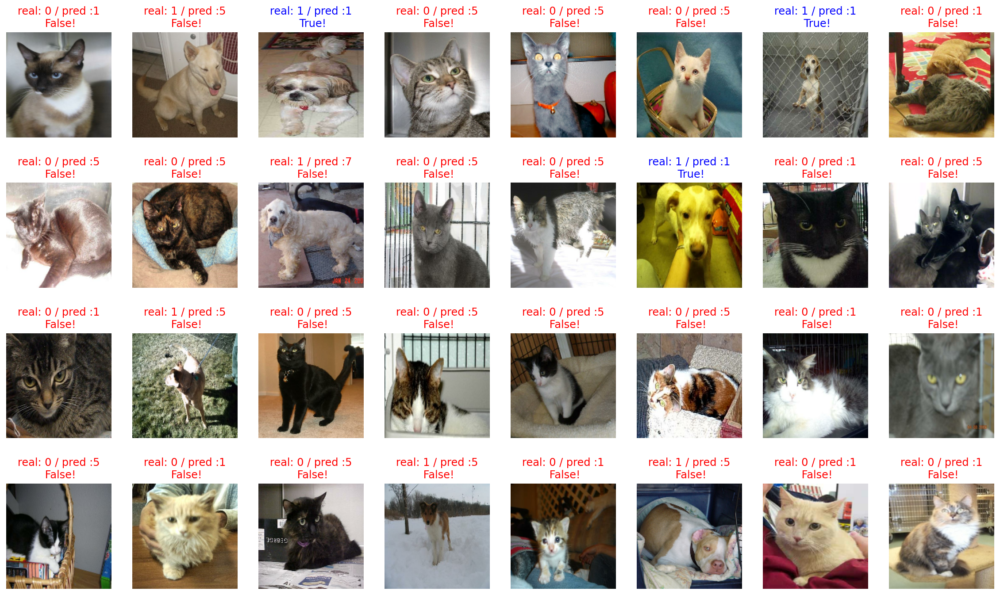

In [52]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [53]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

9.375


## 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기

In [54]:
!mkdir -p ~/aiffel/cat_vs_dog/checkpoint
!mkdir -p ~/aiffel/cat_vs_dog/images

In [55]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


## 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

In [56]:
!ln -s ~/data/* ~/aiffel/cat_vs_dog/images/

ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/my_dog.jpg': File exists


In [57]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

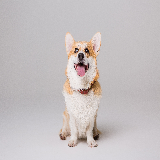

In [58]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [59]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [60]:
prediction = model.predict(dog_image)
prediction

array([[3.2033250e-02, 1.0518955e-05, 8.3451379e-10, 4.3296389e-04,
        2.9582347e-06, 1.0480955e-02, 2.0594976e-03, 8.7476385e-01,
        8.0208696e-02, 7.3290366e-06]], dtype=float32)

In [61]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 0% dog, and 3% cat.


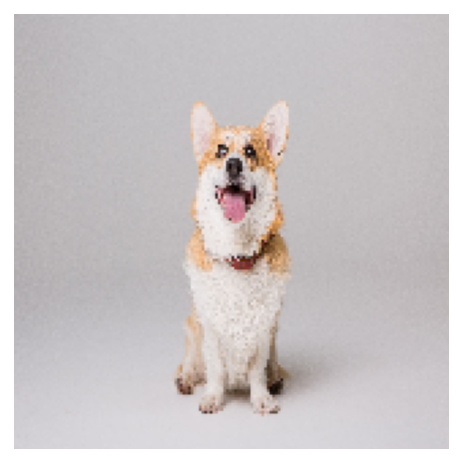

In [62]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 0% cat.


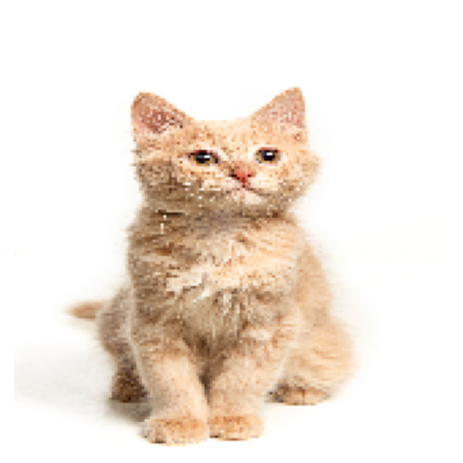

In [64]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 0% cat.


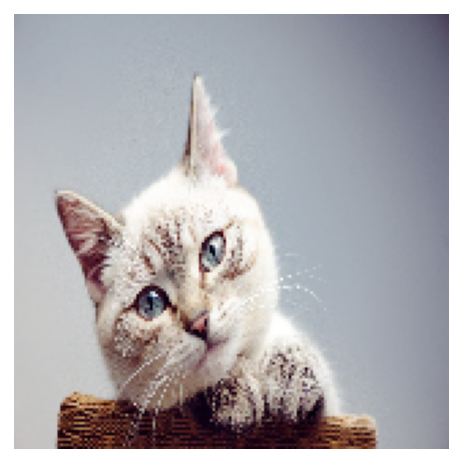

In [65]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)